In [1]:
import timm
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF

import matplotlib.pyplot as plt
import numpy as np
import random
from util import *
from dataset import *


data_path = "data"
mean, std = calculate_overall_mean_std(data_path + "/train_images")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
train_indices = range(140)
val_indices = range(140, 176)
train_dataset = TrainingDataset(data_path, train_indices, std, mean, band_indices=[0, 1, 3, 4, 5, 6, 8, 9, 10]) # From band selection
val_dataset = TrainingDataset(data_path, val_indices, std, mean, band_indices=[0, 1, 3, 4, 5, 6, 8, 9, 10])
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=0)

C:\Users\halfd\inf\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Inspiration from https://github.com/facebookresearch/mae/blob/main/models_mae.py and help modify with ChatGPT

class MaskedAutoencoder(nn.Module):
    def __init__(self, encoder_name="vit_base_patch16_224", img_size=1024, patch_size=16, in_chans=9, mask_ratio=0.75):
        super().__init__()

        # Encoder model
        self.encoder = timm.create_model(
            encoder_name,
            pretrained=False,
            img_size=img_size,
            patch_size=patch_size,
            in_chans=in_chans,
            num_classes=0  # no classification head
        )
        self.band_groups = [0, 0, 1, 1, 1, 1, 2, 2, 2]
        self.in_chans = in_chans
        self.img_size = img_size
        self.patch_size = patch_size
        self.mask_ratio = mask_ratio
        self.embed_dim = self.encoder.num_features  # output dim of encoder

        #decoder
        self.decoder = nn.Sequential(
    nn.LayerNorm(self.embed_dim),
    nn.Linear(self.embed_dim, self.embed_dim * 2),
    nn.GELU(),
    nn.Linear(self.embed_dim * 2, self.embed_dim * 2),
    nn.GELU(),
    nn.Linear(self.embed_dim * 2, self.embed_dim),
    nn.GELU(),
    nn.Linear(self.embed_dim, patch_size * patch_size * in_chans)
)


        self.group_embed = nn.Parameter(torch.zeros(1, 3, self.embed_dim))  # 3 groups
        nn.init.trunc_normal_(self.group_embed, std=0.02)

    def forward(self, x):
        x_patches = self.encoder.patch_embed(x)
        x_patches = self.encoder._pos_embed(x_patches)

        if getattr(self.encoder, 'num_prefix_tokens', 0) > 0:
            x_patches = x_patches[:, self.encoder.num_prefix_tokens:]

        x_patches = x_patches + self._band_embedding(x)

        x_visible, mask, ids_restore = self._apply_mask(x_patches)

        for blk in self.encoder.blocks:
            x_visible = blk(x_visible)
        x_visible = self.encoder.norm(x_visible)

        decoded = self.decoder(x_visible)

        return decoded, mask, ids_restore

    def _band_embedding(self, x):
        B, C, H, W = x.shape
        p = self.patch_size
        num_patches = (H // p) * (W // p)
    
        group_ids = torch.tensor(self.band_groups, device=x.device)  
        band_embeddings = self.group_embed[:, group_ids] 
    
        band_embed = band_embeddings.mean(dim=1, keepdim=False) 
        band_embed = band_embed.expand(B, num_patches, -1)        
        return band_embed


    def _apply_mask(self, x_patches):
        # Randomly mask patches
        B, N, D = x_patches.shape
        len_keep = int(N * (1 - self.mask_ratio))

        noise = torch.rand(B, N, device=x_patches.device)
        ids_shuffle = torch.argsort(noise, dim=1)
        ids_restore = torch.argsort(ids_shuffle, dim=1)

        ids_keep = ids_shuffle[:, :len_keep]
        x_visible = torch.gather(x_patches, dim=1, index=ids_keep.unsqueeze(-1).expand(-1, -1, D))

        mask = torch.ones(B, N, device=x_patches.device)
        mask[:, :len_keep] = 0
        mask = torch.gather(mask, dim=1, index=ids_restore)

        return x_visible, mask, ids_restore

    def rebuild_image(self, decoded, ids_restore):
        #Rebuild from patches
        B, L_visible, patch_dim = decoded.shape
        N = ids_restore.shape[1]
        device = decoded.device

        full_patches = torch.zeros(B, N, patch_dim, device=device)

        ids_restore_visible = ids_restore[:, :L_visible]
        ids_restore_visible = ids_restore_visible.unsqueeze(-1).expand(-1, -1, patch_dim)
        full_patches.scatter_(1, ids_restore_visible, decoded)

        h = w = int(N ** 0.5)

        full_patches = full_patches.view(B, h, w, self.in_chans, self.patch_size, self.patch_size)
        full_patches = full_patches.permute(0, 3, 1, 4, 2, 5).contiguous()
        images = full_patches.view(B, C, h * p, w * p)

        return images

    def _patchify(self, imgs):
        # Split images into patches
        B, C, H, W = imgs.shape
        p = self.patch_size
        assert H % p == 0 and W % p == 0

        imgs = imgs.reshape(B, C, H // p, p, W // p, p)
        imgs = imgs.permute(0, 2, 4, 1, 3, 5).contiguous()
        patches = imgs.view(B, (H // p) * (W // p), C * p * p)

        return patches


In [3]:
def compute_loss(model, imgs, decoded, mask, ids_restore): # Mean squared error
    original_patches = model._patchify(imgs) 
    ids_keep = ids_restore[:, :decoded.size(1)] 
    original_visible = torch.gather(
        original_patches, dim=1,
        index=ids_keep.unsqueeze(-1).expand(-1, -1, original_patches.size(-1))
    )

    loss = ((original_visible - decoded) ** 2).mean()
    return loss


Epoch [1/20], Loss: 1.039562


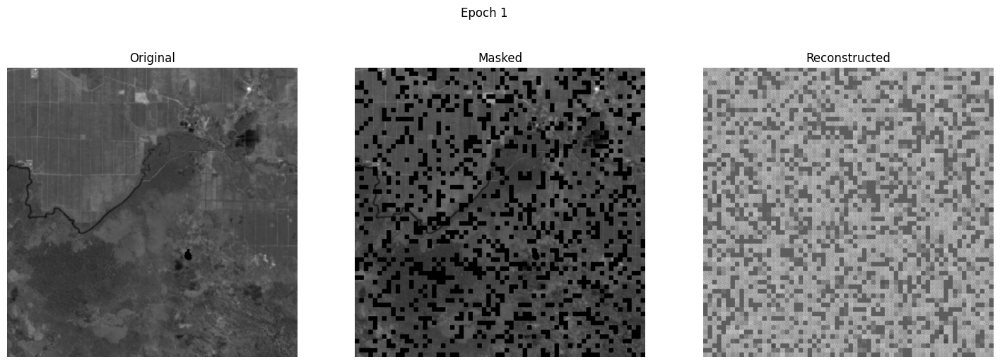

Epoch [2/20], Loss: 0.995384


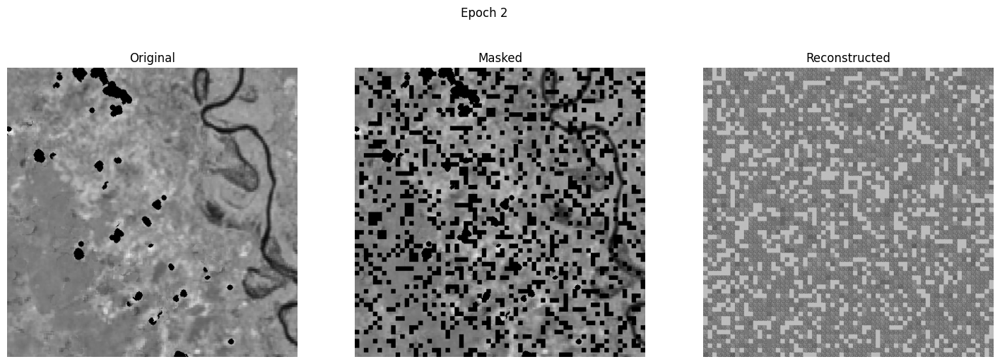

Epoch [3/20], Loss: 0.974111


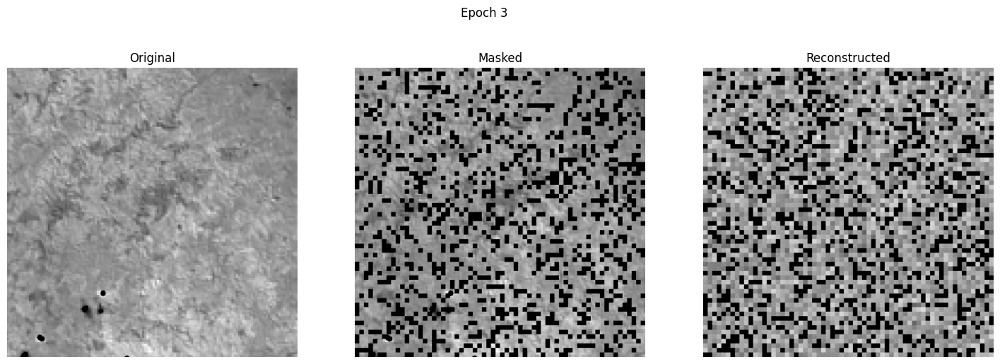

Epoch [4/20], Loss: 0.938460


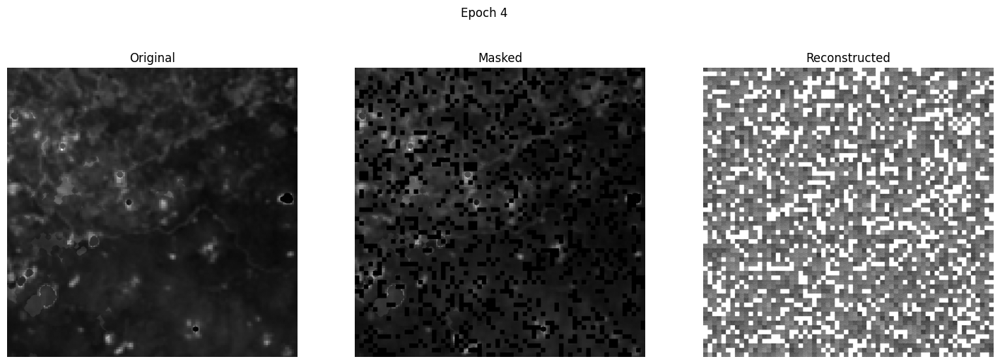

Epoch [5/20], Loss: 0.955823


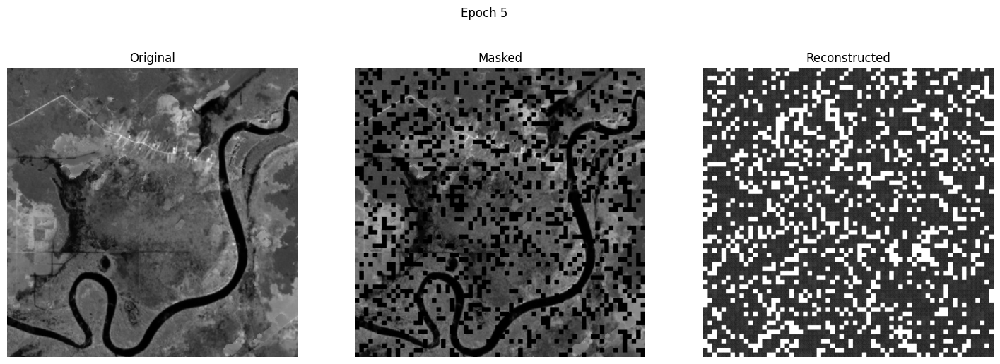

Epoch [6/20], Loss: 0.953897


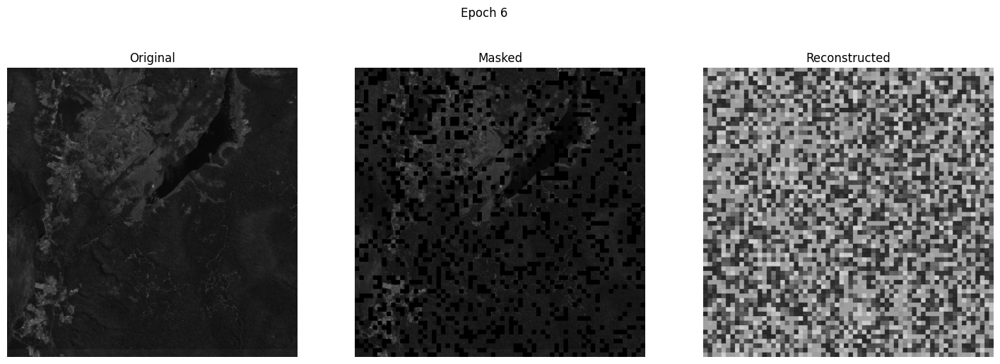

Epoch [7/20], Loss: 0.931084


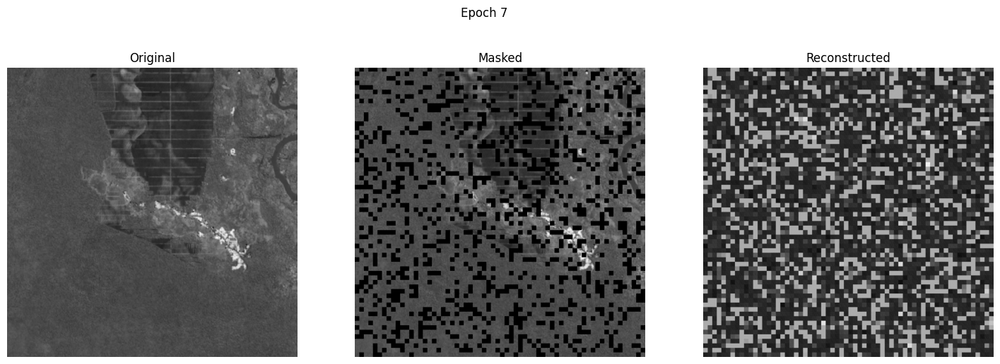

Epoch [8/20], Loss: 0.901492


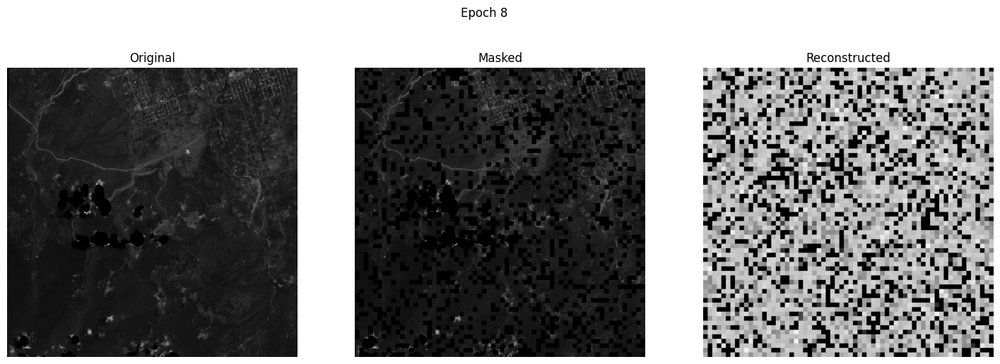

Epoch [9/20], Loss: 0.905628


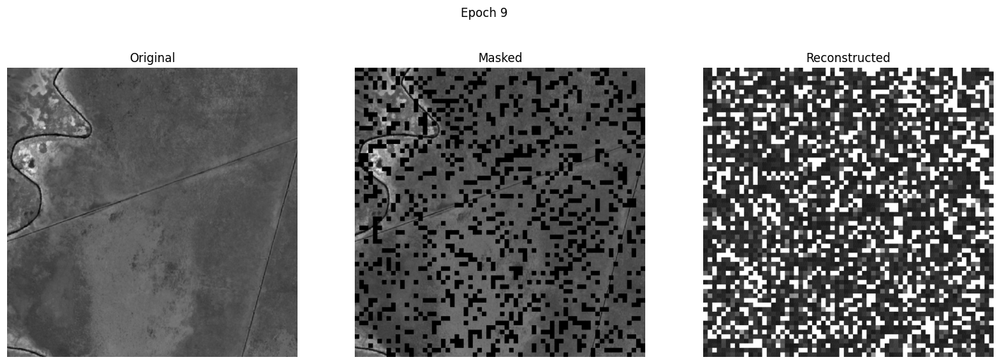

Epoch [10/20], Loss: 0.885519


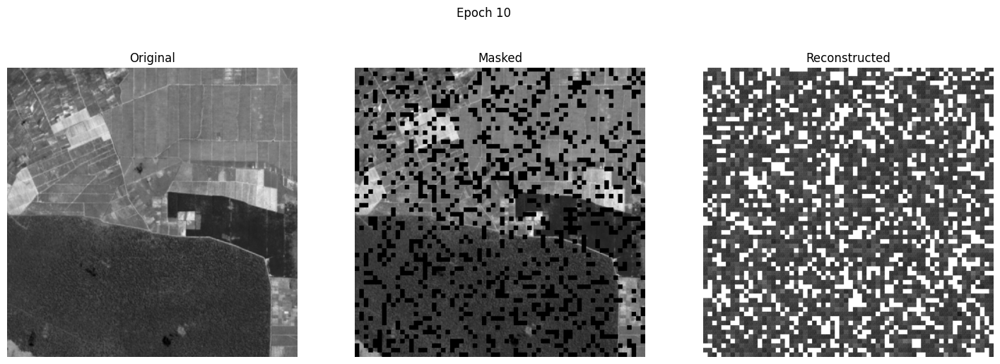

Epoch [11/20], Loss: 0.880590


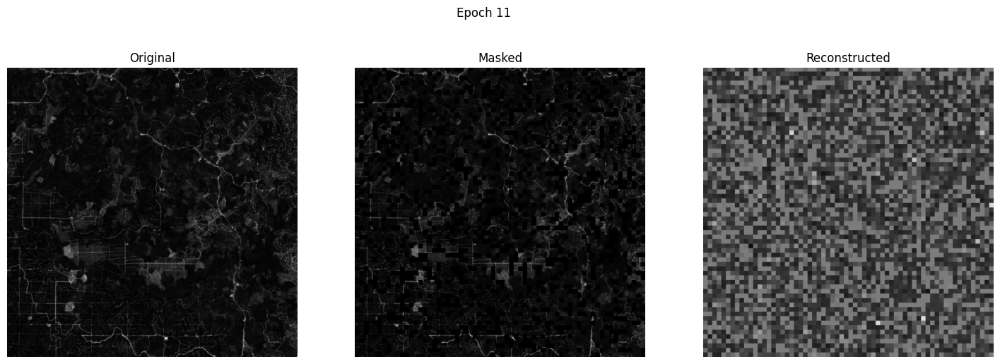

Epoch [12/20], Loss: 0.912016


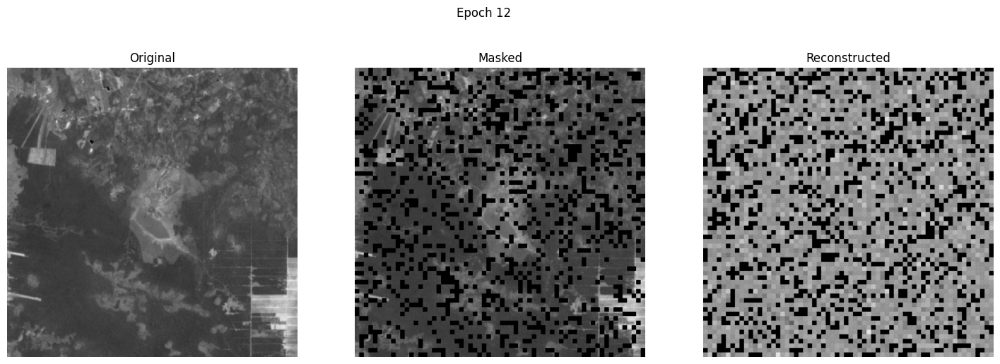

Epoch [13/20], Loss: 0.888346


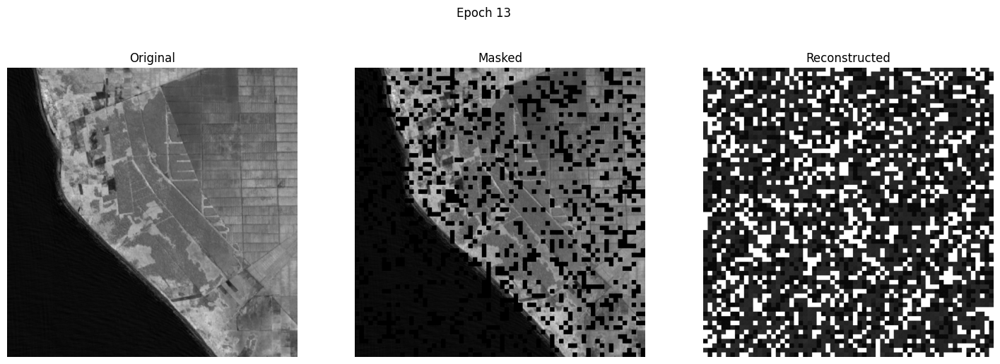

Epoch [14/20], Loss: 0.871990


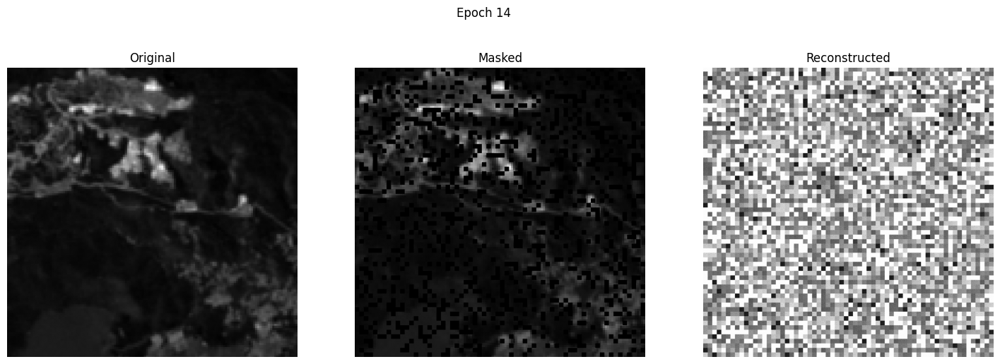

Epoch [15/20], Loss: 0.896222


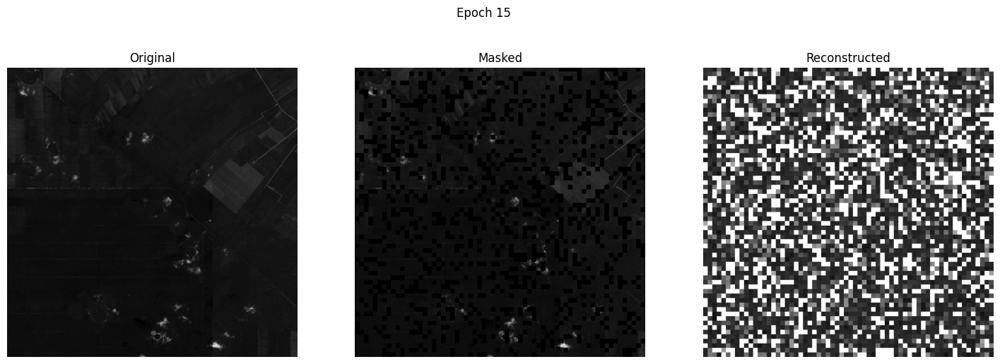

Epoch [16/20], Loss: 0.881007


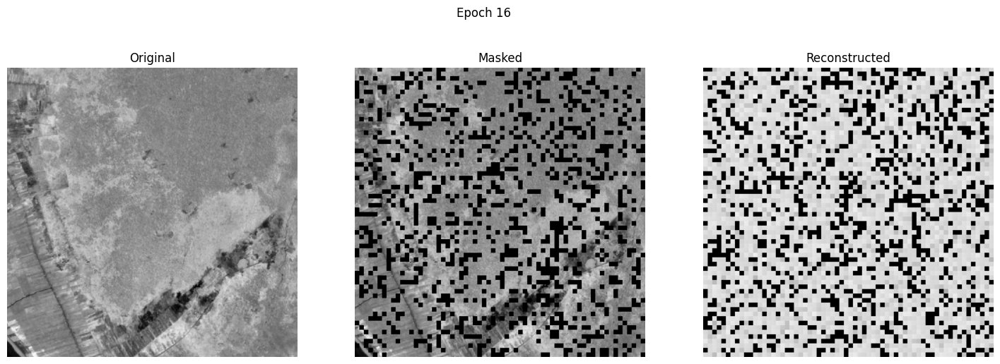

Epoch [17/20], Loss: 0.881337


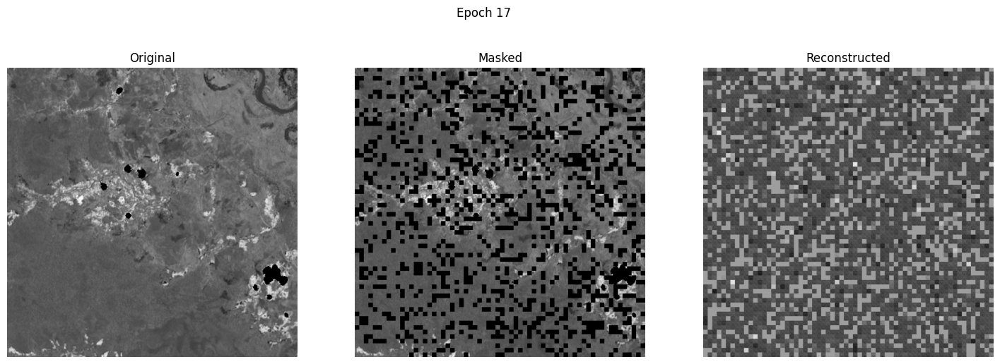

Epoch [18/20], Loss: 0.887357


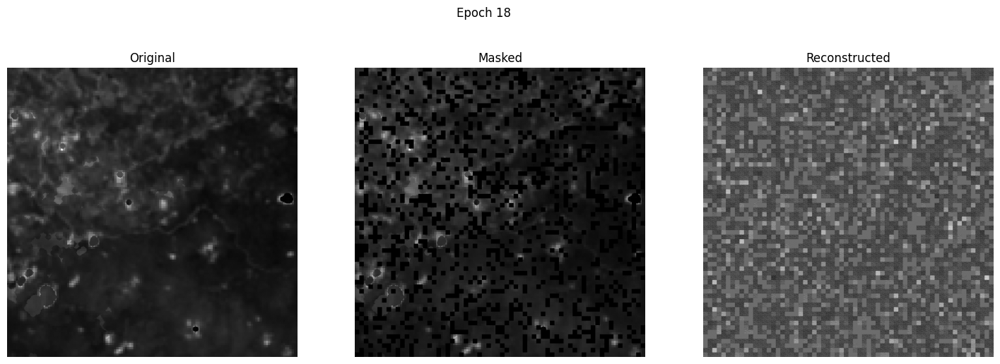

Epoch [19/20], Loss: 0.867970


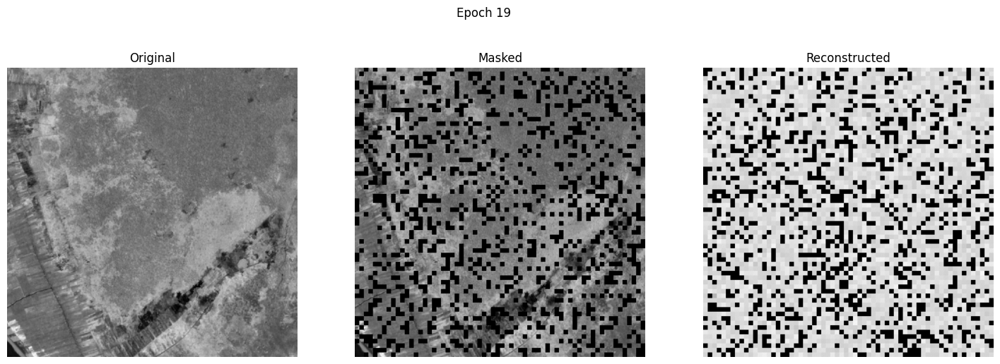

Epoch [20/20], Loss: 0.861744


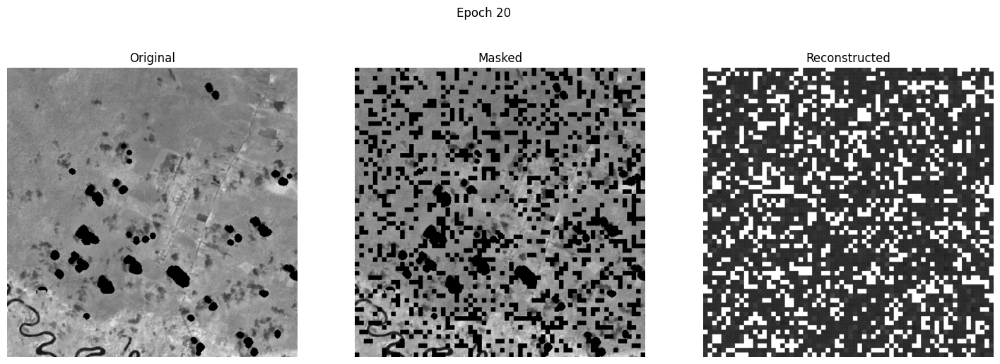

In [4]:

model = MaskedAutoencoder(
    encoder_name="vit_base_patch16_224",
    img_size=1024,
    patch_size=16,
    in_chans=9,
    mask_ratio=0.25
).to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)
num_epochs = 20

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, _ in train_loader:
        images = images.to(device)

        optimizer.zero_grad()
        decoded, mask, ids_restore = model(images)
        reconstructed = model.rebuild_image(decoded, ids_restore)

        loss = compute_loss(model, images, decoded, mask, ids_restore)
        
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.6f}")


    model.eval()
    with torch.no_grad():
        random_idx = random.randint(0, 9) #Show random image from first 9
        image, _ = val_dataset[random_idx] # Only need image not mask

        images = images.to(device) 
        decoded, mask, ids_restore = model(images)
        reconstructed = model.rebuild_image(decoded, ids_restore)
 
        band_idx = random.randint(0, 8) #Show random band
        original_band = images[0, band_idx].cpu().numpy()
        predicted_band = reconstructed[0, band_idx].cpu().numpy()
        original_band = (original_band - original_band.min()) / (original_band.max() - original_band.min())
        predicted_band = (predicted_band - predicted_band.min()) / (predicted_band.max() - predicted_band.min())

        patch_size = model.patch_size
        mask_patches = mask[0] 
        h = w = int(mask_patches.shape[0]**0.5) # Half height half width
        mask_image = mask_patches.view(h, w).repeat_interleave(patch_size, 0).repeat_interleave(patch_size, 1).cpu().numpy()

        masked_band = original_band.copy()
        masked_band[mask_image == 1] = 0 # Visualize masks

        # Plot
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))

        axs[0].imshow(original_band, cmap='gray')
        axs[0].set_title("Original")

        axs[1].imshow(masked_band, cmap='gray')
        axs[1].set_title("Masked")

        axs[2].imshow(predicted_band, cmap='gray')
        axs[2].set_title("Reconstructed")

        for ax in axs:
            ax.axis('off')

        plt.suptitle(f'Epoch {epoch+1}')
        plt.show()


In [5]:

torch.save(model.encoder.state_dict(), "encoder_weights.pth") # Saving the weights to load in main
